## Output from Splotch is a set of DE genes per region. Compare this set of DE bacteria

In [1]:
%matplotlib inline
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import pickle
import operator
import matplotlib
import scanpy as sc
import scipy.stats as stats
import statsmodels.stats.multitest as multi
from collections import defaultdict
import csv 
from numpy import inf
csv.field_size_limit(sys.maxsize)
from ast import literal_eval
plt.rcParams['figure.figsize'] = [15, 10]
pd.set_option("display.max_rows", 50, "display.max_columns", 50)

In [2]:
'Ignore warnings'
import warnings
warnings.filterwarnings('ignore')

Load definitions

In [3]:
def get_distance(p1,p2):
     return abs((p1) - (p2))

flatten = lambda t: [item for sublist in t for item in sublist]
def Extract(lst): 
    return list(next(zip(*lst))) 
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2)) 
def union(lst1, lst2): 
    final_list = lst1 + lst2 
    return final_list
def ftest(aba_spec_cutoff,st_spec_cutoff):
    # DIFFERENTIAL GENES PER REGION - Fisher's exact test
    bb_count = 0
    fisher_dict = {}
    pval_list = []

    ct = np.unique(aba_spec_cutoff['ident'].tolist())
    for condition, df in st_spec_cutoff.groupby('condition'):

            ####################### Fisher's exact test
            #########################################################################
            #regions_tmp = list(set(st_spec_cutoff['ABA_aar1'].tolist()))
            print(condition)
            regions_tmp = list(set(st_spec_cutoff['AAR1'].tolist()))

            regions = [x for x in regions_tmp if str(x) != 'nan']

            for i in regions:

                for j in ct:
                    # print(i,j)
                    #break

                    #ST genes
                    #st_genes = df[df['ABA_aar1'] == i]['gene'].tolist()
                    st_genes = df[df['AAR1'] == i]['genes']

                    # ABA-genes
                    aba_genes = aba_spec_cutoff[aba_spec_cutoff['ident'] == j]['gene'].tolist()

                    # ST genes in all other regions
                    #st_rest = df[df['ABA_aar1'] != i]['gene'].tolist()
                    st_rest = df[df['AAR1'] != i]['genes']

                    # ABA genes in all other regions
                    aba_rest = aba_spec_cutoff[aba_spec_cutoff['ident'] != j]['gene'].tolist()

                    # g1 = genes in both ST and ABA
                    # g2 = genes unique to ST
                    # g3 = genes unique to ABA
                    # g4 = genes neither in st or aba region but in the other regions

                    g1 = len(list(set(st_genes).intersection(aba_genes)))
                    g2 = len(list(set(aba_genes).difference(set(st_genes)))) 
                    g3 = len(list(set(st_genes).difference(set(aba_genes))))
                    g4 = len(list(set(st_rest).union(aba_rest)))

                    # print(list(set(st_genes).intersection(aba_genes)))

                    # Fisher's test
                    oddsratio, pvalue = stats.fisher_exact([[g4, g2], [g3, g1]], alternative='greater')

                    # Store pvalues in list to use for multiple corrections testing
                    pval_list.append(pvalue)

                    # Store fisher's test results in DF
                    ff = [condition, i, j, oddsratio, pvalue, g1,list(set(st_genes).intersection(aba_genes)) ]
                    # print(i, j, g1, g2, g3, g4, pvalue)

                    if bb_count == 0:
                        fisher_dict[bb_count] = ff

                        df_ff = pd.DataFrame.from_dict(fisher_dict)

                        df_ff['idx'] = ['condition', 'AAR_ST', 'ident','Odds ratio', 'p value', 'Num shared genes', 'shared genes']

                        df_ff.set_index('idx', inplace = True)

                        bb_count += 1
                    else:
                        df_ff[bb_count] = ff

                        bb_count += 1

    # Do multiple testing correction on the pvalues
    pp = multi.multipletests(pval_list, alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)

    df_ff_t = df_ff.T 

    # Add corrected p-values
    df_ff_t['p-value, corrected'] = list(pp[1])
    
    return df_ff_t


In [4]:
'Read in BF file'
# Load ST files
path = '/home/sanjavickovic/data/host-microbiome_data/splotch_outputs/wt_gf_zeros/'

# Read file
filename = os.path.join(path, 'BF.tsv.gz')

# makes initial pd
fields = ['gene', 'condition_1', 'condition_2', 'AAR1', 'AAR2', 'BF', 'Delta', 'Samples_1', 'Samples_2']
# reader = pd.read_csv(filename, sep='\t', chunksize=int(100000), engine='python', skipinitialspace=True, usecols=fields)    

# # makes small pkl files
# for i, chunk in enumerate(reader):
#     out_file = path + "/data_subsetall_{}.pkl".format(i+1)
#     print("Processing chunk: ", i+1)
#     with open(out_file, "wb") as f:
#         pickle.dump(chunk,f,pickle.HIGHEST_PROTOCOL)

# arranges pkl files into a df
data_p_files=[]
for name in glob.glob(os.path.join(path,"data_subsetall_*.pkl")):
       data_p_files.append(name)
        
df = pd.DataFrame([])
for i in range(len(data_p_files)):
    print("Reading chunk: ", i+1, ' out of: ', len(data_p_files))
    df_pickle = pd.read_pickle(data_p_files[i])
    int_genes = np.unique(df_pickle[df_pickle.gene.isin([i for i in df_pickle.gene if "Bacteria" in i])]['gene'])
    df_pickle = df_pickle.loc[df_pickle.gene.isin(int_genes)]
    print("Bacteria in file: ", len(df_pickle))
    df = df.append(df_pickle,ignore_index=False)  

# rename gene names
df_all = df.copy()
df_all['gene_new'] = Extract(df['gene'].str.split("_",0))   
df_all['condition_1'] = [i.split(" ")[0] for i in df_all['condition_1']]
df_all['condition_2'] = [i.split(" ")[0] for i in df_all['condition_2']]


Reading chunk:  1  out of:  35
Bacteria in file:  192
Reading chunk:  2  out of:  35
Bacteria in file:  0
Reading chunk:  3  out of:  35
Bacteria in file:  192
Reading chunk:  4  out of:  35
Bacteria in file:  0
Reading chunk:  5  out of:  35
Bacteria in file:  0
Reading chunk:  6  out of:  35
Bacteria in file:  384
Reading chunk:  7  out of:  35
Bacteria in file:  384
Reading chunk:  8  out of:  35
Bacteria in file:  0
Reading chunk:  9  out of:  35
Bacteria in file:  384
Reading chunk:  10  out of:  35
Bacteria in file:  0
Reading chunk:  11  out of:  35
Bacteria in file:  192
Reading chunk:  12  out of:  35
Bacteria in file:  0
Reading chunk:  13  out of:  35
Bacteria in file:  192
Reading chunk:  14  out of:  35
Bacteria in file:  0
Reading chunk:  15  out of:  35
Bacteria in file:  0
Reading chunk:  16  out of:  35
Bacteria in file:  384
Reading chunk:  17  out of:  35
Bacteria in file:  192
Reading chunk:  18  out of:  35
Bacteria in file:  960
Reading chunk:  19  out of:  35
Bac

Get interesting gene indexes

In [5]:
#int_index = df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])].index # subsets the lines plots

In [6]:
#int_genes = np.unique(df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])]['gene'])

Plot density plots for a specific gene of interest based on BF filtering

In [7]:
# # Load ST files
# path = '/home/sanjavickovic/data/host-microbiome_data/splotch_outputs/wt_gf_zeros'

# # Read file
# filename = os.path.join(path, 'BF.tsv.gz')

# # makes initial pd
# fields = ['gene','Samples_1']
# # reader = pd.read_csv(filename, sep='\t', chunksize=int(100000), engine='python', 
# #                      skipinitialspace=True, usecols=fields)    
# # # makes small pkl files
# # for i, chunk in enumerate(reader):
# #     out_file = path + "/data_samples1_{}.pkl".format(i+1)
# #     print("Processing chunk: ", i+1)
# #     with open(out_file, "wb") as f:
# #         pickle.dump(chunk,f,pickle.HIGHEST_PROTOCOL)

# # arranges pkl files into a df
# data_p_files=[]
# for name in glob.glob(path + "/data_samples1_*.pkl"):
#        data_p_files.append(name)
        
# df_dens_s1 = pd.DataFrame([])
# for i in range(len(data_p_files)):
#     print("Reading chunk: ", i+1, ' out of: ', len(data_p_files))
#     df_pickle = pd.read_pickle(data_p_files[i])
#     df_pickle = df_pickle.loc[df_pickle.gene.isin(int_genes)]
#     print("Bacteria in file: ", len(df_pickle))
#     df_dens_s1 = df_dens_s1.append(df_pickle,ignore_index=False)  

In [8]:
# # Load ST files
# path = '/home/sanjavickovic/data/host-microbiome_data/splotch_outputs/wt_gf_zeros'

# # Read file
# filename = os.path.join(path, 'BF.tsv.gz')

# # makes initial pd
# fields = ['gene','Samples_2']
# # reader = pd.read_csv(filename, sep='\t', chunksize=int(100000), engine='python', 
# #                      skipinitialspace=True, usecols=fields)    
# # # makes small pkl files
# # for i, chunk in enumerate(reader):
# #     out_file = path + "/data_samples2_{}.pkl".format(i+1)
# #     print("Processing chunk: ", i+1)
# #     with open(out_file, "wb") as f:
# #         pickle.dump(chunk,f,pickle.HIGHEST_PROTOCOL)

# # arranges pkl files into a df
# data_p_files=[]
# for name in glob.glob(path + "/data_samples2_*.pkl"):
#        data_p_files.append(name)
        
# df_dens_s2 = pd.DataFrame([])
# for i in range(len(data_p_files)):
#     print("Reading chunk: ", i+1, ' out of: ', len(data_p_files))
#     df_pickle = pd.read_pickle(data_p_files[i])
#     df_pickle = df_pickle.loc[df_pickle.gene.isin(int_genes)]
#     print("Bacteria in file: ", len(df_pickle))
#     df_dens_s2 = df_dens_s2.append(df_pickle, ignore_index=False)  

In [9]:
'Get new gene names'

'Get new gene names'

In [10]:
# df_dens_s1['gene_new'] = Extract(df_dens_s1['gene'].str.split("_",0)) 
# df_dens_s2['gene_new'] = Extract(df_dens_s2['gene'].str.split("_",0)) 

Prints density plots AAR1 vs Rest within the same genotype

In [14]:
# Pick gene based on BF analysis
#gene = 'Lactobacillus-Lactobacillaceae-Lactobacillales-Bacilli-Firmicutes-Bacteria'

# Pick part of colon
region1 = "GF"
region2 = "WT"

# aar1s = ['pellet','mucosa and pellet','crypt apex and mucosa','crypt apex and crypt mid', 
#        'crypt mid', 'crypt base', 'epithelium', 'epithelium and mucosae',
#        'epithelium and mucosae and submucosa',
#        'epithelium and muscle and submucosa', 'muscle and submucosa','mucosae and interna',
#         'interna', 'externa and interna','externa',
#        "peyer's patch"]

aar1s = ['pellet','mucosa and pellet','crypt apex and mucosa','crypt apex and crypt mid', 
       'crypt mid', 'crypt base', 
       "peyer's patch"]

In [15]:
# for gene in np.unique(df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])]['gene_new']):
    
#     fig = matplotlib.pyplot.figure()
#     fig.set_size_inches([12,len(aar1s)])

#     axes = fig.subplots(ncols = 1, nrows = len(aar1s),)

#     for count, aar in enumerate(aar1s):
#         print(aar)

#         # subset based on chosen parameters
#         df_tmp = df_all[(df_all['AAR1'] == aar) & (df_all['AAR2'] == 'Rest')]
#         #df_tmp = df_tmp[(df_tmp['condition_1'] == region1) | (df_tmp['condition_1'] == region2)]
#         gene_idx = df_tmp[df_tmp['gene_new'] == gene].index

#         # Check if any gene index is there
#         if len(gene_idx.tolist()) == 0:
#             if len([i for i in l if i==gene]) == 0:
#                  print("Condition not satisfied ... ")

#         m1 = np.mean(literal_eval(df_dens_s1['Samples_1'][gene_idx.tolist()[0]]))
#         sns.distplot(literal_eval(df_dens_s1['Samples_1'][gene_idx.tolist()[0]]),
#                      hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
#                      label=aar, ax = axes[count], color = sns.color_palette("tab10")[0])
#         bf2 = round(np.mean(np.log(df_all.loc[gene_idx.tolist()]['BF'].astype(float)).tolist()),2)
#         delta2 = round(np.mean(df_all.loc[gene_idx.tolist()]['Delta'].astype(float).tolist()),2)

#         m2 = np.mean(literal_eval(df_dens_s2['Samples_2'][gene_idx.tolist()[0]]))
#         sns.distplot(literal_eval(df_dens_s2['Samples_2'][gene_idx.tolist()[0]]),
#                      hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
#                      label='Rest', ax = axes[count], color = sns.color_palette("tab10")[4])

#         # print out delta in the upper left corner of each plot 
#         if m1 > m2:
#             deltas2 = round(get_distance(m1,m2),2)
#         else:
#             deltas2 = -round(get_distance(m1,m2),2)


#         if count == 0:
#             axes[count].set_title(df_tmp[df_tmp['gene_new'] == gene]['condition_1'].tolist()[0])

#         if count == len(aar1s)-1:
#             axes[count].set_xlabel(r'%s $\beta_{level\ 1}$'%(gene.split("-")[0]))
#         axes[count].set_ylabel('Posterior \n probability \n density')

#         #plot legend
#         colors = [sns.color_palette("tab10")[0], sns.color_palette("tab10")[4]]
#         texts = ['WT_'+aar,'Rest']
#         patches = [plt.plot([],[], marker='_', ms=10, ls="", mec=None, color=colors[i], 
#                     label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]

#         axes[count].legend(handles = patches,labels = texts, bbox_to_anchor=(1.05, 0.5, 0.3, 0.2), loc='center left', borderaxespad=0)
#         axes[count].text(0.05, 0.8, r'$\Delta_{%s} = $'%(aar)+(str(deltas2)), ha="left", va="center", transform=axes[count].transAxes)
#         #axes[count,0].text(0.05, 0.5, r'$\Delta_{%s} = $'%(aar)+(str(delta1)), ha="left", va="center", transform=axes[count,0].transAxes)
#         axes[count].text(0.05, 0.3, r'$log(BF)_{%s} = $'%(aar)+(str(bf2)), ha="left", va="center", transform=axes[count].transAxes)

#         axes[count].axvline(m1, 0,1,linestyle='dashed', c = "blue", alpha = 0.5)
#         axes[count].axvline(m2, 0,1,linestyle='dashed', c = "purple", alpha = 0.5)
#         #axes[count,0].set_xlim([-15,3])
#         #axes[count,1].set_xlim([1,3])
#         #axes[count,0].set_ylim([0,15])
#         #xes[count,1].set_ylim([0,15])
#         break
    
#     fig.tight_layout()
#     fig.savefig('../../output/figures/density_plot_all_aars_onlywt_'+gene+'_'+region1+"_and_"+region2+'.pdf', dpi=400, bbox_inches='tight')


pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex and mucosa
crypt apex and crypt mid
crypt mid
crypt base
peyer's patch
pellet
mucosa and pellet
crypt apex a

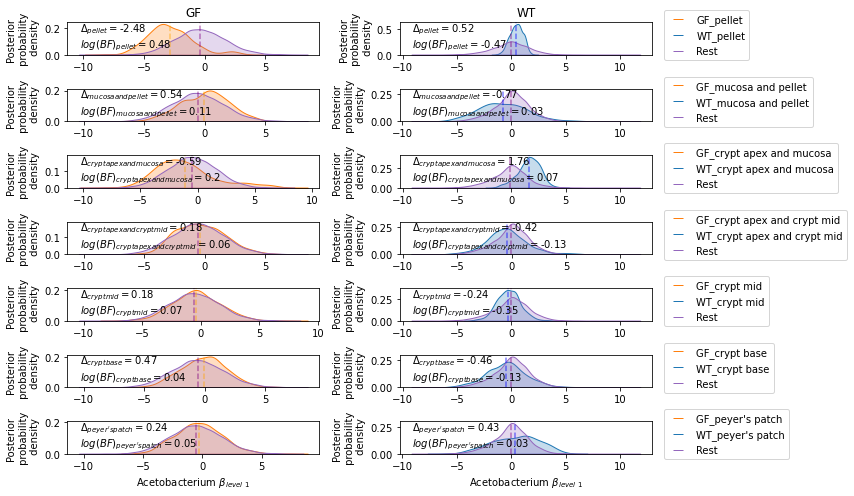

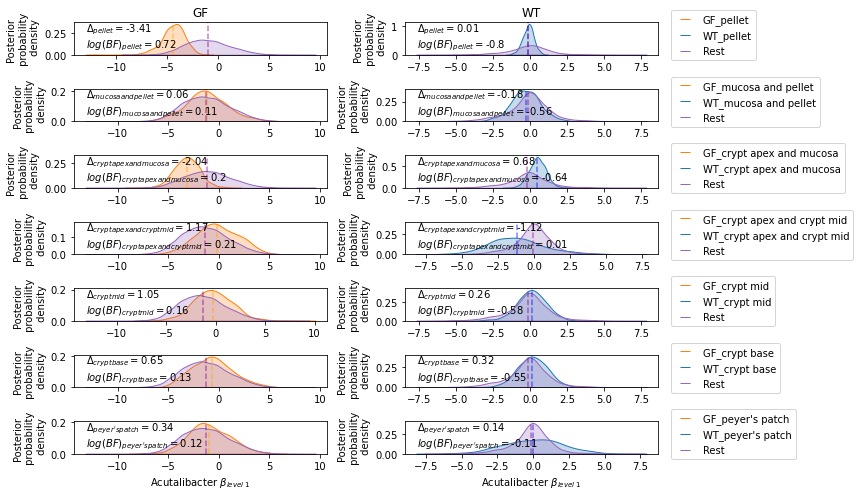

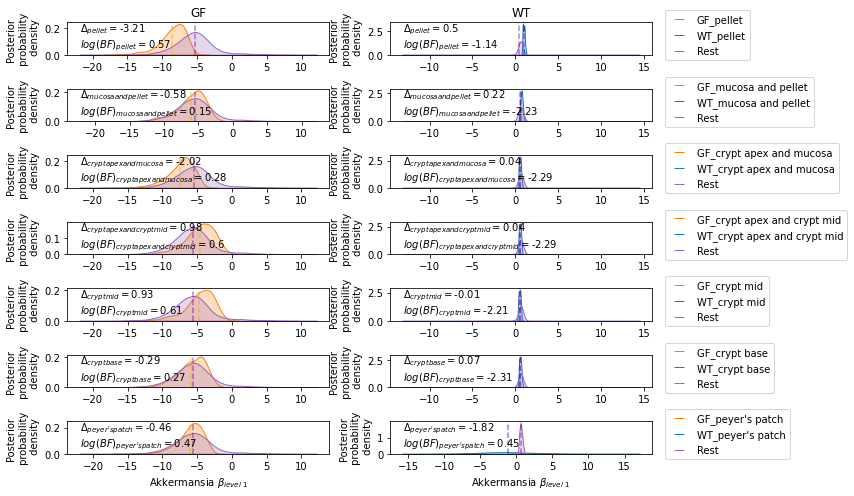

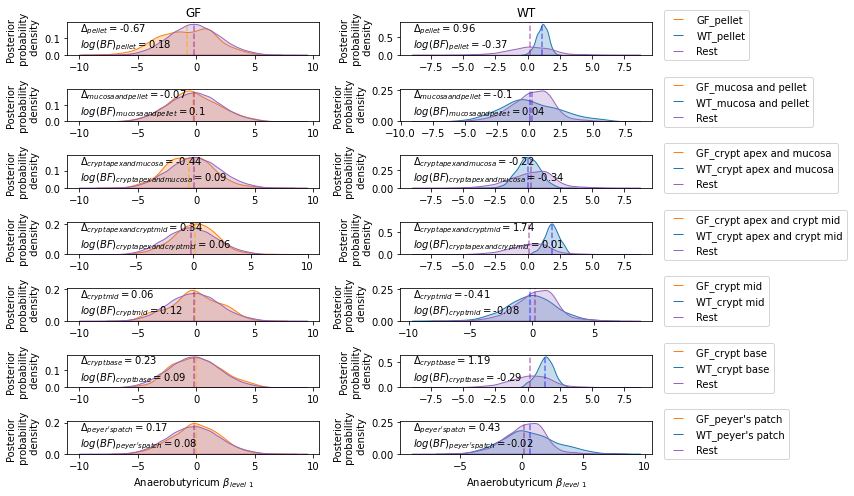

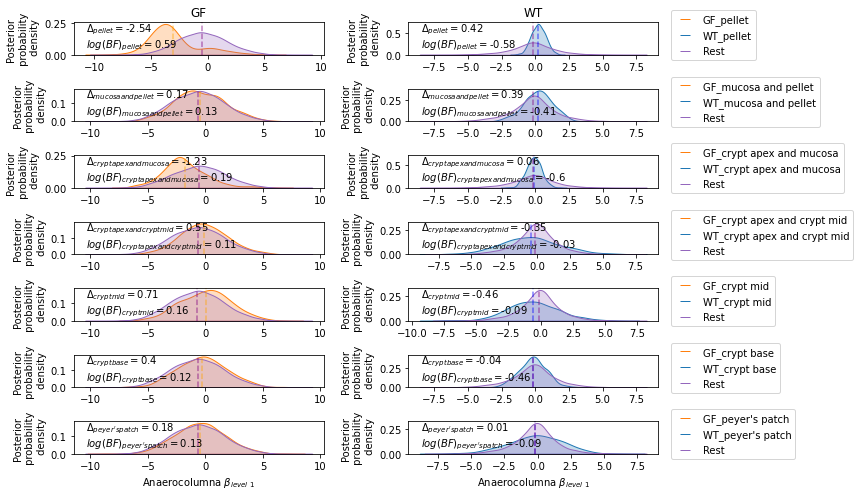

...

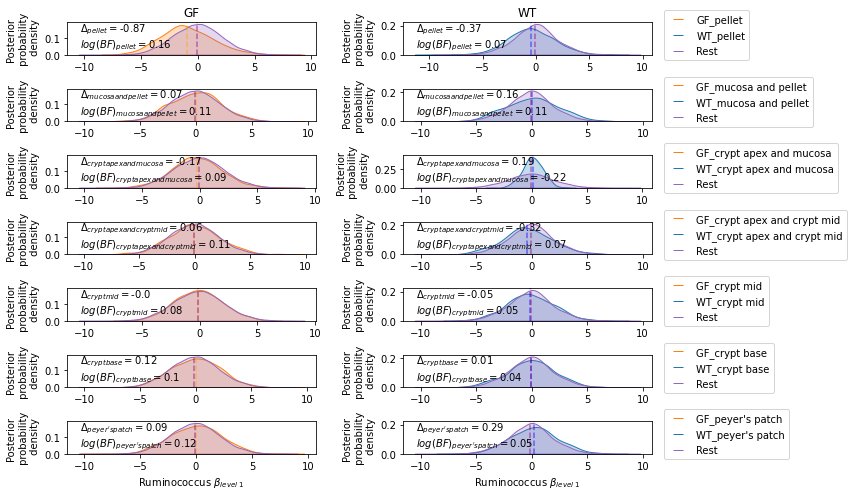

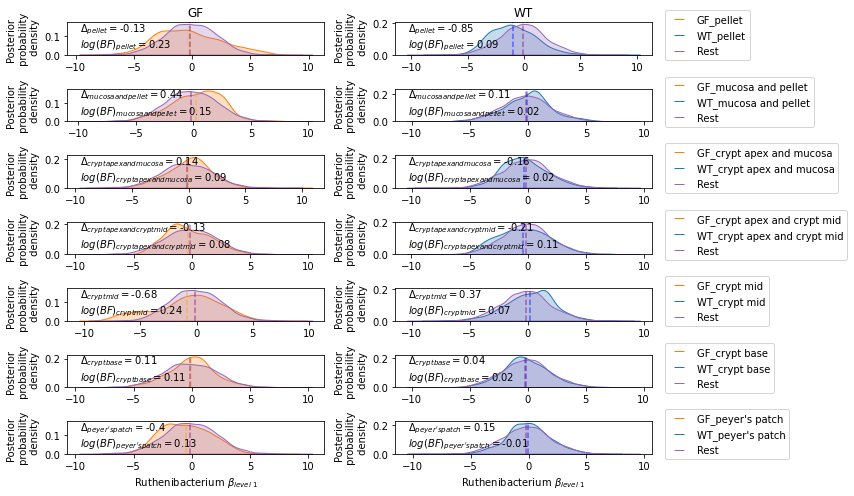

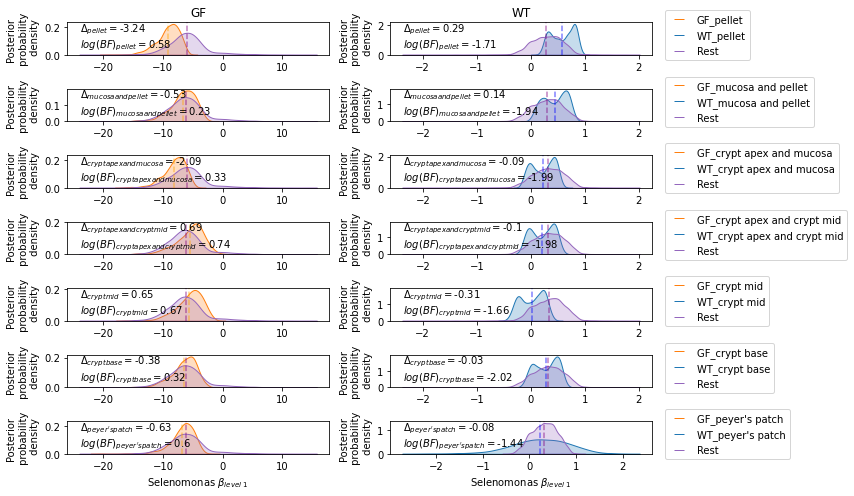

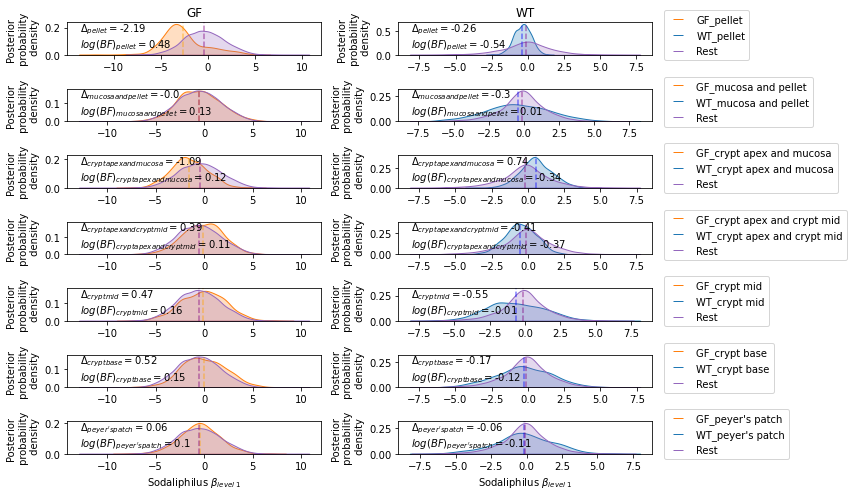

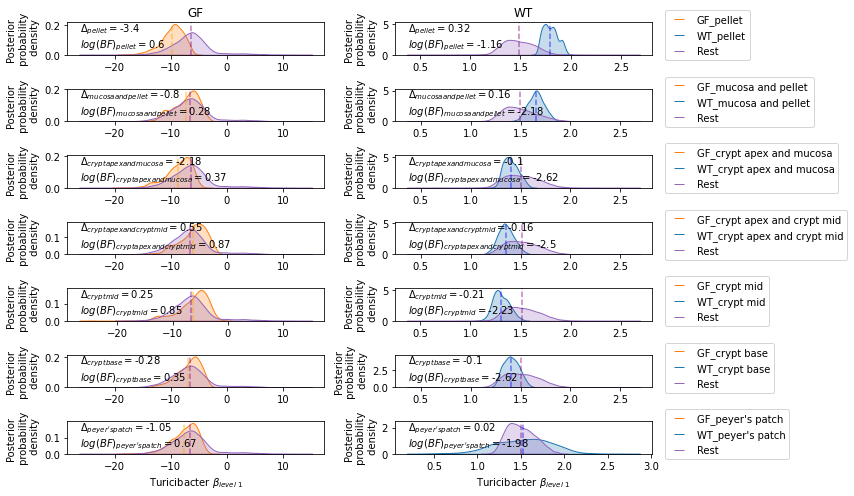

In [16]:
for gene in np.unique(df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])]['gene_new']):
#for gene in ['Massilistercora-Eubacteriales-incertae-sedis-Eubacteriales-Clostridia-Firmicutes-Bacteria']:   
    fig = matplotlib.pyplot.figure()
    fig.set_size_inches([12,len(aar1s)])

    axes = fig.subplots(ncols = 2, nrows = len(aar1s),)

    for count, aar in enumerate(aar1s):
        print(aar)

        # subset based on chosen parameters
        df_tmp = df_all[(df_all['AAR1'] == aar) & (df_all['AAR2'] == 'Rest')]
        #df_tmp = df_tmp[(df_tmp['condition_1'] == region1) | (df_tmp['condition_1'] == region2)]
        gene_idx = df_tmp[df_tmp['gene_new'] == gene].index

        # Check if any gene index is there
        if len(gene_idx.tolist()) == 0:
            if len([i for i in l if i==gene]) == 0:
                 print("Condition not satisfied ... ")

        multiple_lists = df_tmp.loc[gene_idx.tolist()][0:1]['Samples_1']
        arrays = [np.array(literal_eval(x)) for x in multiple_lists]
        
        m1 = np.mean([np.mean(k) for k in zip(*arrays)])
        bf1 = round(np.mean(np.log(df_tmp.loc[gene_idx.tolist()]['BF'].astype(float)).tolist()[0:2]),2)
        delta1 = round(np.mean(df_tmp.loc[gene_idx.tolist()]['Delta'].astype(float).tolist()[0:2]),2)

        sns.distplot([np.mean(k) for k in zip(*arrays)],
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label=aar, ax = axes[count, 0], color = sns.color_palette("tab10")[1])

        multiple_lists = df_tmp.loc[gene_idx.tolist()][0:1]['Samples_2']
        arrays = [np.array(literal_eval(x)) for x in multiple_lists]

        m2 = np.mean([np.mean(k) for k in zip(*arrays)])
        sns.distplot([np.mean(k) for k in zip(*arrays)],
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label='Rest', ax = axes[count, 0], color = sns.color_palette("tab10")[4])

        # print out delta in the upper left corner of each plot 
        if m1 > m2:
            deltas1 = round(get_distance(m1,m2),2)
        else:
            deltas1 = -round(get_distance(m1,m2),2)

        axes[count,0].axvline(m1, 0,1,linestyle='dashed', c = "orange", alpha = 0.5)
        axes[count,0].axvline(m2, 0,1,linestyle='dashed', c = "purple", alpha = 0.5)

        m1 = np.mean(literal_eval(df_tmp['Samples_1'][gene_idx.tolist()[2]]))
        sns.distplot(literal_eval(df_tmp['Samples_1'][gene_idx.tolist()[2]]),
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label=aar, ax = axes[count, 1], color = sns.color_palette("tab10")[0])
        bf2 = round(np.mean(np.log(df_tmp.loc[gene_idx.tolist()]['BF'].astype(float)).tolist()[2]),2)
        delta2 = round(np.mean(df_tmp.loc[gene_idx.tolist()]['Delta'].astype(float).tolist()[2]),2)

        m2 = np.mean(literal_eval(df_tmp['Samples_2'][gene_idx.tolist()[2]]))
        sns.distplot(literal_eval(df_tmp['Samples_2'][gene_idx.tolist()[2]]),
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label='Rest', ax = axes[count, 1], color = sns.color_palette("tab10")[4])

        # print out delta in the upper left corner of each plot 
        if m1 > m2:
            deltas2 = round(get_distance(m1,m2),2)
        else:
            deltas2 = -round(get_distance(m1,m2),2)


        if count == 0:
            axes[count,0].set_title(df_tmp[df_tmp['gene_new'] == gene]['condition_1'].tolist()[0])
            axes[count,1].set_title(df_tmp[df_tmp['gene_new'] == gene]['condition_1'].tolist()[2])

        if count == len(aar1s)-1:
            axes[count,0].set_xlabel(r'%s $\beta_{level\ 1}$'%(gene.split("-")[0]))
            axes[count,1].set_xlabel(r'%s $\beta_{level\ 1}$'%(gene.split("-")[0]))
        axes[count,0].set_ylabel('Posterior \n probability \n density')
        axes[count,1].set_ylabel('Posterior \n probability \n density')

        #plot legend
        colors = [sns.color_palette("tab10")[1], sns.color_palette("tab10")[0], sns.color_palette("tab10")[4]]
        texts = ['GF_'+aar,'WT_'+aar,'Rest']
        patches = [plt.plot([],[], marker='_', ms=10, ls="", mec=None, color=colors[i], 
                    label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]

        axes[count,1].legend(handles = patches,labels = texts, bbox_to_anchor=(1.05, 0.5, 0.3, 0.2), loc='center left', borderaxespad=0)
        axes[count,0].text(0.05, 0.8, r'$\Delta_{%s} = $'%(aar)+(str(deltas1)), ha="left", va="center", transform=axes[count,0].transAxes)
        #axes[count,0].text(0.05, 0.5, r'$\Delta_{%s} = $'%(aar)+(str(delta1)), ha="left", va="center", transform=axes[count,0].transAxes)
        axes[count,0].text(0.05, 0.3, r'$log(BF)_{%s} = $'%(aar)+(str(bf1)), ha="left", va="center", transform=axes[count,0].transAxes)
        axes[count,1].text(0.05, 0.8, r'$\Delta_{%s} = $'%(aar)+(str(deltas2)), ha="left", va="center", transform=axes[count,1].transAxes)
        #axes[count,1].text(0.05, 0.5, r'$\Delta_{%s} = $'%(aar)+(str(delta2)), ha="left", va="center", transform=axes[count,1].transAxes)
        axes[count,1].text(0.05, 0.3, r'$log(BF)_{%s} = $'%(aar)+(str(bf2)), ha="left", va="center", transform=axes[count,1].transAxes)

        axes[count,1].axvline(m1, 0,1,linestyle='dashed', c = "blue", alpha = 0.5)
        axes[count,1].axvline(m2, 0,1,linestyle='dashed', c = "purple", alpha = 0.5)
        #axes[count,0].set_xlim([-15,3])
        #axes[count,1].set_xlim([1,3])
        #axes[count,0].set_ylim([0,15])
        #xes[count,1].set_ylim([0,15])

    fig.tight_layout()
    fig.savefig('../../output/figures/density_plot_all_aars_'+gene+'_'+region1+"_and_"+region2+'.pdf', dpi=400, bbox_inches='tight')


In [32]:
np.unique(df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])]['gene_new'])

array(['Acetobacterium-Eubacteriaceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Acutalibacter-Oscillospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Akkermansia-Akkermansiaceae-Verrucomicrobiales-Verrucomicrobiae-Verrucomicrobia-Bacteria',
       'Anaerobutyricum-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Anaerocolumna-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Anaerostipes-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Bacteroides-Bacteroidaceae-Bacteroidales-Bacteroidia-Bacteroidetes-Bacteria',
       'Barnesiella-Barnesiellaceae-Bacteroidales-Bacteroidia-Bacteroidetes-Bacteria',
       'Blautia-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Butyrivibrio-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Clostridioides-Peptostreptococcaceae-Eubacteriales-Clostridia-Firmicutes-Bacteria',
       'Clostridium-Clostridiaceae-Eubacterial

Plot average density plot per cell type

In [12]:
# Pick gene based on BF analysis
gene = 'Lachnospira-Lachnospiraceae-Eubacteriales-Clostridia-Firmicutes-Bacteria'

# Pick interesting regions
aar1s = ['pellet','mucosa and pellet','crypt apex and mucosa', 'crypt apex and crypt mid', 'crypt mid', 'crypt base', "peyer's patch"]

# Pick part of colon
region1 = "WT"
region2 = "GF"

# subset based on chosen parameters
df_tmp = df_all[(df_all['condition_1'] == region1) & (df_all['condition_2'] == region2)]
df_tmp = df_tmp[df_tmp['AAR1'].isin(aar1s)& (df_tmp['AAR2'] != "Rest")]

             
# # Check if any gene index is there
# if len(gene_idx.tolist()) == 0:
#     print("Condition not satisfied ... ")



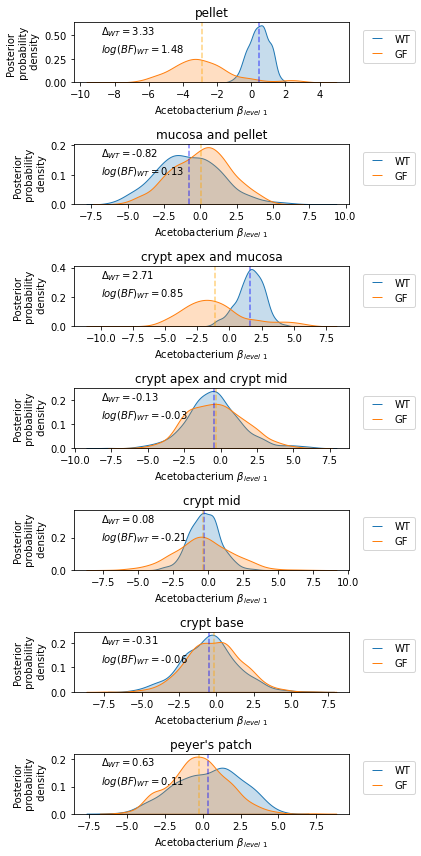

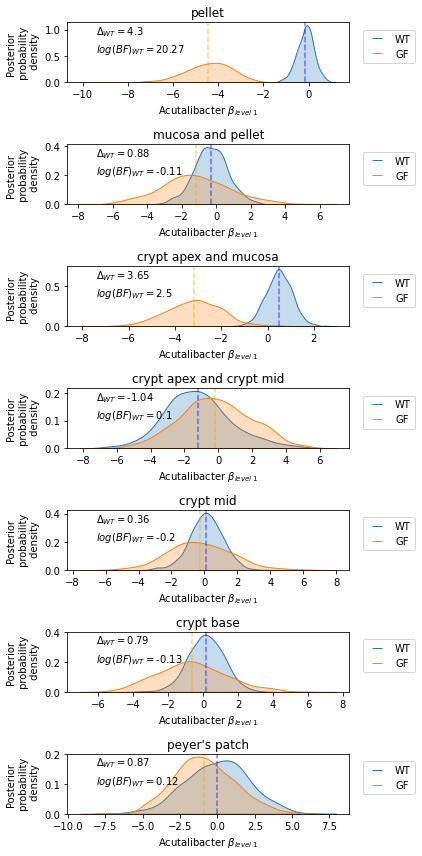

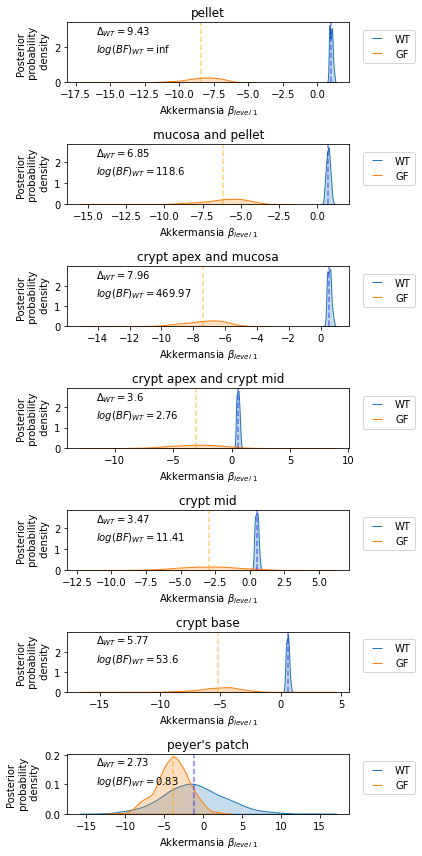

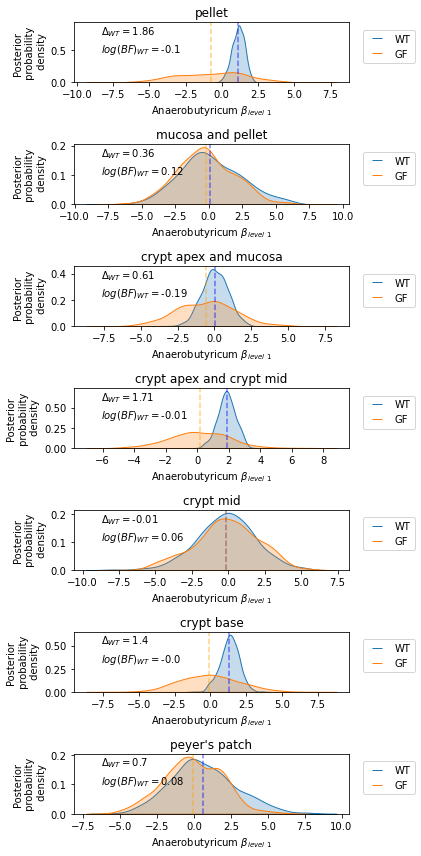

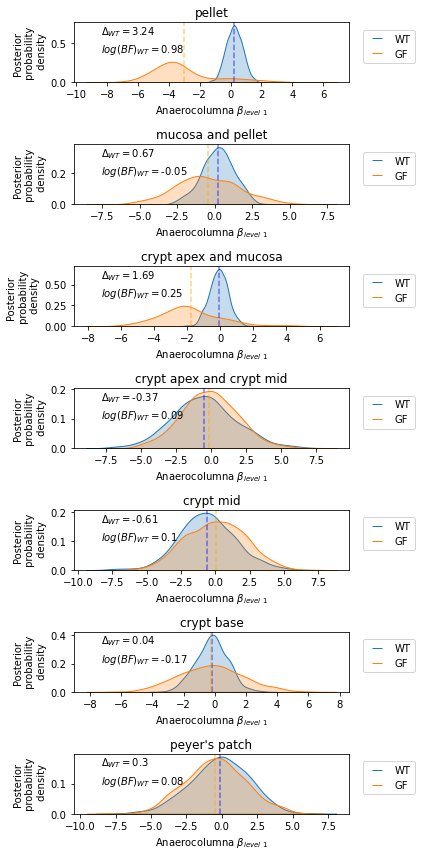

...

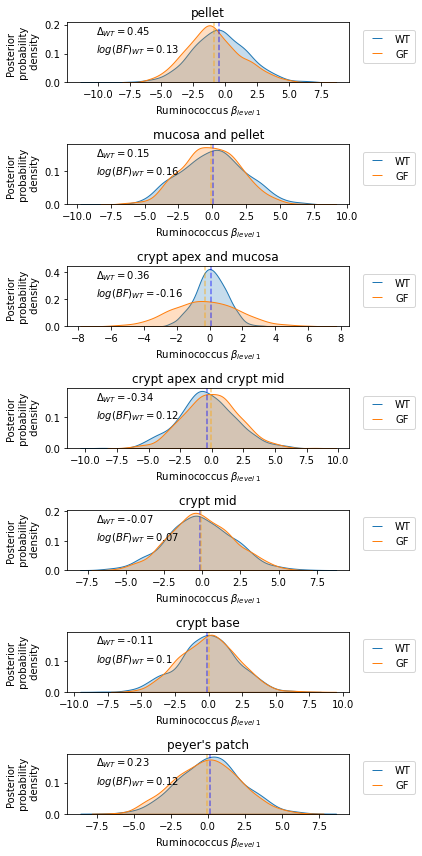

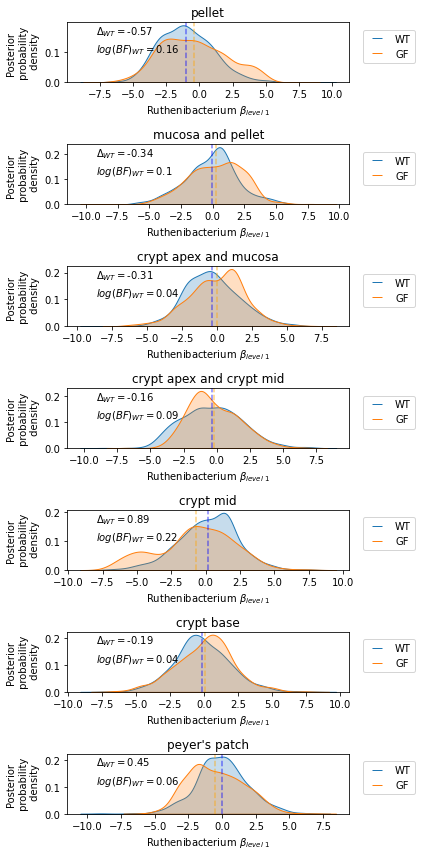

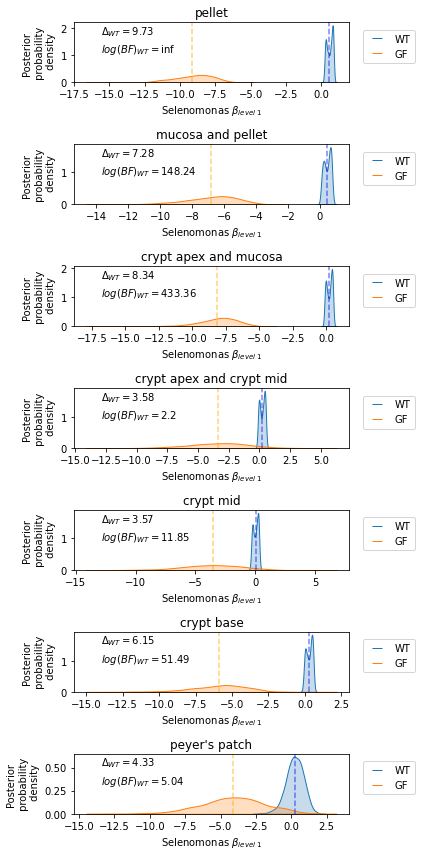

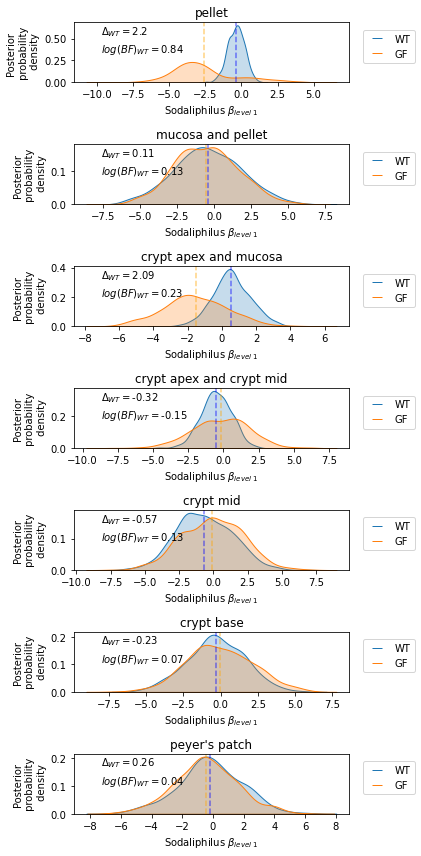

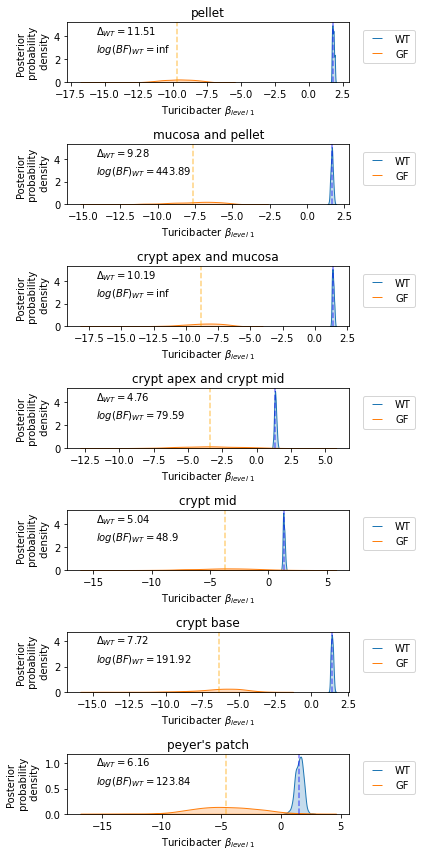

In [14]:
for gene in np.unique(df_all[df_all.gene.isin([i for i in df_all.gene if "Bacteria" in i])]['gene_new']):
    fig = matplotlib.pyplot.figure()
    fig.set_size_inches([6,12])

    # initialize axes
    axes = fig.subplots(ncols = 1, nrows = len(aar1s),)


    for count, aar in enumerate(aar1s):
        df_tmpsun = df_tmp[df_tmp['AAR1'] == aar]   
        gene_idx = df_tmpsun[df_tmpsun['gene_new'] == gene].index

        multiple_lists = df_tmpsun.loc[gene_idx.tolist()]['Samples_1']
        arrays = [np.array(literal_eval(x)) for x in multiple_lists]
        m1 = np.mean([np.mean(k) for k in zip(*arrays)])

    #     m1 = np.mean(literal_eval(df_dens_s1['Samples_1'][gene_idx.tolist()[1]]),)
        sns.distplot([np.mean(k) for k in zip(*arrays)],
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label=aar, ax = axes[count], color = sns.color_palette("tab10")[0])

        multiple_lists = df_tmpsun.loc[gene_idx.tolist()]['Samples_2']
        arrays = [np.array(literal_eval(x)) for x in multiple_lists]
        m2 = np.mean([np.mean(k) for k in zip(*arrays)])

    #     m2 = np.mean(literal_eval(df_dens_s2['Samples_2'][gene_idx.tolist()[1]]),)
        sns.distplot([np.mean(k) for k in zip(*arrays)],
                     hist=False,kde=True,kde_kws = {'shade': True, 'linewidth': 1},
                     label=aar,  ax = axes[count], color = sns.color_palette("tab10")[1])

        #axes[count].set_xlim(-2,2)
        axes[count].set_xlabel(r'%s $\beta_{level\ 1}$'%(gene.split("-")[0]))
        axes[count].set_ylabel('Posterior \n probability \n density')
        axes[count].set_title('%s'%(aar))

        colors = [sns.color_palette("tab10")[0],sns.color_palette("tab10")[1]]
        texts = [region1, region2]
        patches = [ plt.plot([],[], marker='_', ms=10, ls="", mec=None, color=colors[i], 
                    label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]

        axes[count].legend(handles = patches,labels = texts, bbox_to_anchor=(1.05, 0.5, 0.3, 0.2), loc='center left', borderaxespad=0)

        # print out delta in the upper left corner of each plot 
        if m2 > m1:
            deltas = -round(get_distance(m1,m2),2)
        else:
            deltas = round(get_distance(m1,m2),2)

        # prints betas
        x = np.log(df_all.loc[gene_idx.tolist()]['BF'].astype(float).tolist())
        x[x == -inf] = sys.float_info.min # makes sure no inf
        x[x == inf] = sys.float_info.max # makes sure no inf
        bf = round(np.mean(x),2)
        axes[count].axvline(m1, 0,1,linestyle='dashed', c = "blue", alpha = 0.5)
        axes[count].axvline(m2, 0,1,linestyle='dashed', c = "orange", alpha = 0.5)
        axes[count].text(0.1, 0.8, r'$\Delta_{WT} = $'+(str(deltas)), ha="left", va="baseline", transform=axes[count].transAxes)
        axes[count].text(0.1, 0.5, r'$log(BF)_{WT} = $'+(str(bf)), ha="left", va="baseline", transform=axes[count].transAxes)

    fig.tight_layout() 
    fig.savefig('../../output/figures/density_plot_all_aars_'+gene+'_'+region1+"_vs_"+region2+'.pdf', dpi=400, bbox_inches='tight')

